

#### NOVA IMS / BSc in Data Science / Text Mining 2024/2025
### <b>Group Project: "Solving the Hyderabadi Word Soup"</b>
#### Notebook `Co-occurrence analysis of dishes and clustering to identify cuisines.`

#### Group:
- Dinis Fernandes #20221848
- Dinis Gaspar #20221869
- Inês Santos #20221916
- Luis Davila #20221949
- Sara Ferrer #20221947




#### <font color='#BFD72'>Table of Contents </font> <a class="anchor" id='toc'></a> 
- [0. Literature Review](#0-literature-review)
- [1. Imports](#1-imports)
- [2. The Data](#2-the-data)
- [3. Explanatory Data Analysis (EDA)](#3-explanatory-data-analysis-eda)
- [4. Dishes Recognition](#4-dishes-recognition)
    - [4.1. Pre-Trained-roberta-base-food-ner](#41-pre-trained-roberta-base-food-ner)
    - [4.2. Analysis of Dishes](#42-analysis-of-dishes)
- [5. Co-occurence Analysis](#5-co-occurence-analysis)
- [6. Clustering](#6-clustering)
    - [6.1. Vectorization](#61-vectorization)
    - [6.2. K-Means](#62-k-means)
    - [6.3. Hierarquical](#63-hierarquical)
    - [6.4. HDBScan](#64-hdbscan)
    - [6.5. Optics](#65-optics)
    - [6.6. Results Cluster Models](#66-results-cluster-models)
    - [6.7. Results Graph and Cuisines Wordclouds](#67-results-graph-and-cuisines-wordclouds)
- [7. References](#7-references)



## 0. Literature Review

[1] Akujuobi, U., Liu, S. & Besold, T.R. Revisiting named entity recognition in food computing: enhancing performance and robustness. Artif Intell Rev 57, 241 (2024). https://doi.org/10.1007/s10462-024-10834-y


[2] M. Goel et al., "Deep Learning Based Named Entity Recognition Models for Recipes," in Proceedings of the 2024 Joint International Conference on Computational Linguistics, Language Resources and Evaluation (LREC-COLING 2024), 2024, pp. 4542–4554. [Online]. Available: https://aclanthology.org/2024.lrec-main.406.pdf

## 1. Imports

[Back to TOC](#toc)

In [1]:
import re
import numpy as np
import networkx as nx
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

import pickle

from collections import defaultdict
from collections import Counter

from wordcloud import WordCloud

from gensim.models.doc2vec import Doc2Vec, TaggedDocument

from utils import pipeline_v2
from utils.pipeline_v2 import replace_words_dict, cooccurrence_network_generator, elbow_finder, plotter_3d_cluster
from utils.pipeline_v2 import word_freq_calculator, cluster_namer, plot_dendrogram, unsupervised_score_calculator
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans, HDBSCAN, OPTICS, AgglomerativeClustering
from sklearn.decomposition import TruncatedSVD
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_score, calinski_harabasz_score, adjusted_mutual_info_score

import nltk
from nltk.tokenize import PunktSentenceTokenizer
from nltk.tokenize import word_tokenize
sent_tokenizer=PunktSentenceTokenizer()

#pandas and numpy for df manipulation
import pandas as pd
import re
import nltk
from nltk.metrics import distance as nltk_distance
nltk.download('averaged_perceptron_tagger_eng')

#Preprocessing: tokenization
from nltk.tokenize import RegexpTokenizer

#NER and Metrics with sklearn and sklearn_crfsuite
from sklearn.model_selection import train_test_split
import sklearn_crfsuite
from sklearn_crfsuite import metrics
from sklearn_crfsuite import scorers

import spacy
from spacy import displacy


import os
import plotly.graph_objects as go
import plotly.express as px

pd.set_option('max_colwidth', 80)


[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\luisb\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


## 2. The Data
  
[Back to TOC](#toc)



Loading the dataset

In [291]:
restaurants = pd.read_csv("data/105_restaurants.csv")
restaurants = restaurants.drop(columns=["Links","Cost","Collections","Timings"])
restaurants = restaurants.rename(columns={"Name":"Restaurant"})

restaurants.head()

,Restaurant,Cuisines
0,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian"
1,Paradise,"Biryani, North Indian, Chinese"
2,Flechazo,"Asian, Mediterranean, North Indian, Desserts"
3,Shah Ghouse Hotel & Restaurant,"Biryani, North Indian, Chinese, Seafood, Beverages"
4,Over The Moon Brew Company,"Asian, Continental, North Indian, Chinese, Mediterranean"


In [292]:
reviews = pd.read_csv("data/10k_reviews.csv").rename({'Review':'raw_review'}, axis=1)
reviews.drop(columns = ["Reviewer", "Metadata", "Time", "Pictures"], axis = 1, inplace=True)

reviews.head()

,Restaurant,raw_review,Rating
0,Beyond Flavours,"The ambience was good, food was quite good . had Saturday lunch , which was ...",5
1,Beyond Flavours,Ambience is too good for a pleasant evening. Service is very prompt. Food is...,5
2,Beyond Flavours,A must try.. great food great ambience. Thnx for the service by Pradeep and ...,5
3,Beyond Flavours,Soumen das and Arun was a great guy. Only because of their behavior and sinc...,5
4,Beyond Flavours,Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are g...,5


In [293]:
reviews_copy = reviews.copy()
restaurants_copy = restaurants.copy()

Join both datasets (reviews and restaurants).

In [294]:
restaurants_reviews = pd.merge(restaurants_copy,reviews_copy,on="Restaurant")
restaurants_reviews

,Restaurant,Cuisines,raw_review,Rating
0,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian","The ambience was good, food was quite good . had Saturday lunch , which was ...",5
1,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Ambience is too good for a pleasant evening. Service is very prompt. Food is...,5
2,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",A must try.. great food great ambience. Thnx for the service by Pradeep and ...,5
3,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Soumen das and Arun was a great guy. Only because of their behavior and sinc...,5
4,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are g...,5
...,...,...,...,...
9995,Chinese Pavilion,"Chinese, Seafood",Madhumathi Mahajan Well to start with nice courteous servers and staff. Exce...,3
9996,Chinese Pavilion,"Chinese, Seafood","This place has never disappointed us.. The food, the courteous staff, the se...",4.5
9997,Chinese Pavilion,"Chinese, Seafood","Bad rating is mainly because of ""Chicken Bone found in Veg food"" and is not ...",1.5
9998,Chinese Pavilion,"Chinese, Seafood",I personally love and prefer Chinese Food. Had been here couple of times wit...,4


## 3. Explanatory Data Analysis (EDA)
[Back to TOC](#toc)

In [295]:
restaurants_reviews.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Restaurant  10000 non-null  object
 1   Cuisines    10000 non-null  object
 2   raw_review  9955 non-null   object
 3   Rating      9962 non-null   object
dtypes: object(4)
memory usage: 390.6+ KB


In [296]:
restaurants_reviews.dropna(inplace=True)

Created 3 new variables with information on the structure of each review.

In [297]:
restaurants_reviews["review_len"] = restaurants_reviews["raw_review"].map(lambda content : len(str(content)))
restaurants_reviews["sents"] = restaurants_reviews["raw_review"].map(lambda content :\
                                                                  sent_tokenizer.tokenize(str(content)))
restaurants_reviews["nr_sents"] = restaurants_reviews["sents"].map(lambda content: len(content))

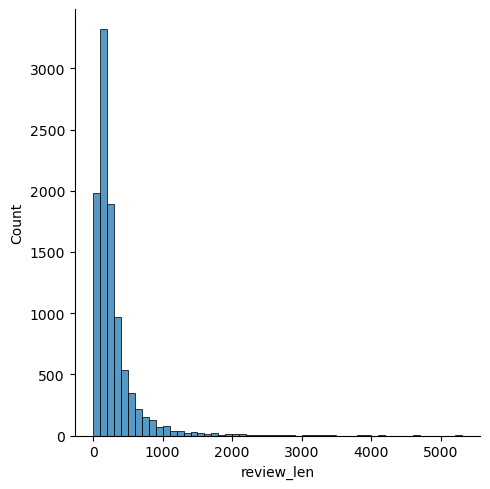

In [298]:
sns.displot(restaurants_reviews["review_len"], binwidth=100)

We see that most reviews have less than 500 characters, with a tail on the right showing outliers reaching reviews with size around 5000 characters.

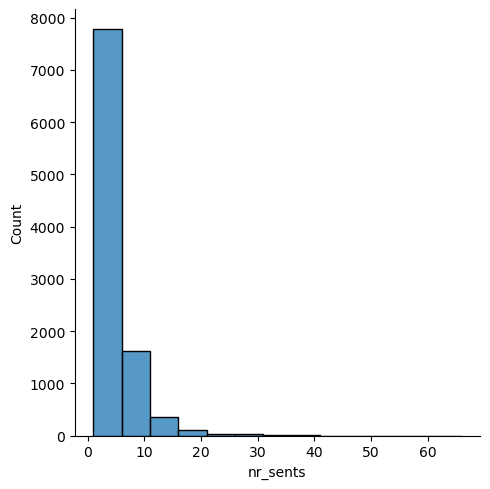

In [299]:
sns.displot(restaurants_reviews["nr_sents"], binwidth=5)


We see that most of the reviews have only a few sentences (less than 5 sentences).

## 4. Dishes Recognition

[Back to TOC](#toc)

### 4.1. Pre-Trained-roberta-base-food-ner

To start our analysis of co-occurrence, we tailored our data preprocessing pipeline to remove stop words and punctuation to make it easier to identify dishes in the reviews.

In [300]:
preprocessor = pipeline_v2.MainPipeline(no_stopwords=True, no_punctuation=True).main_pipeline

restaurants_reviews['preproc_review_ner'] = restaurants_reviews['raw_review'].apply(lambda content: preprocessor(content))

We use a pre-trained model, for the purpose of tagging mentions of food in the text of recipes, to identify the dishes in the reviews.

In [301]:
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline
model = AutoModelForTokenClassification.from_pretrained('carolanderson/roberta-base-food-ner')
tokenizer = AutoTokenizer.from_pretrained("roberta-base", add_prefix_space=False)
nlp = pipeline("ner", model=model, tokenizer=tokenizer)
restaurants_reviews['ner_output'] = restaurants_reviews['preproc_review_ner'].apply(lambda row: nlp(row, aggregation_strategy="first"))

c:\Users\luisb\anaconda3\envs\text-mining1\lib\site-packages\transformers\pipelines\token_classification.py:398: UserWarning: Tokenizer does not support real words, using fallback heuristic
  warnings.warn(


It gives us the dishes that are on each review, it uses NER and the label that it tries to find is 'FOOD'.

In [302]:
restaurants_reviews[['raw_review', 'ner_output']]

,raw_review,ner_output
0,"The ambience was good, food was quite good . had Saturday lunch , which was ...",[]
1,Ambience is too good for a pleasant evening. Service is very prompt. Food is...,[]
2,A must try.. great food great ambience. Thnx for the service by Pradeep and ...,"[{'entity_group': 'FOOD', 'score': 0.83243674, 'word': ' penne', 'start': 88..."
3,Soumen das and Arun was a great guy. Only because of their behavior and sinc...,[]
4,Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are g...,"[{'entity_group': 'FOOD', 'score': 0.8430239, 'word': ' kodi', 'start': 13, ..."
...,...,...
9995,Madhumathi Mahajan Well to start with nice courteous servers and staff. Exce...,"[{'entity_group': 'FOOD', 'score': 0.9195005, 'word': ' jade chicken soup', ..."
9996,"This place has never disappointed us.. The food, the courteous staff, the se...","[{'entity_group': 'FOOD', 'score': 0.79381984, 'word': ' rice', 'start': 89,..."
9997,"Bad rating is mainly because of ""Chicken Bone found in Veg food"" and is not ...","[{'entity_group': 'FOOD', 'score': 0.8618634, 'word': ' hot sour soup', 'sta..."
9998,I personally love and prefer Chinese Food. Had been here couple of times wit...,[]


###  4.2. Analysis of Dishes

In [303]:
restaurants_reviews['ner_output_size'] = restaurants_reviews['ner_output'].apply(lambda row: len(row))

In [304]:
restaurants_reviews['ner_output_size'].value_counts()

0     4955
1     1315
2     1166
3      786
4      527
5      351
6      220
7      155
8      120
9       67
10      51
11      44
13      27
12      25
14      20
17      14
15      13
20      12
18      10
21       9
23       7
16       7
22       7
19       7
28       5
26       4
35       3
25       3
39       3
32       3
37       2
33       2
36       2
53       2
45       2
71       1
24       1
49       1
42       1
30       1
34       1
31       1
29       1
40       1
Name: ner_output_size, dtype: int64

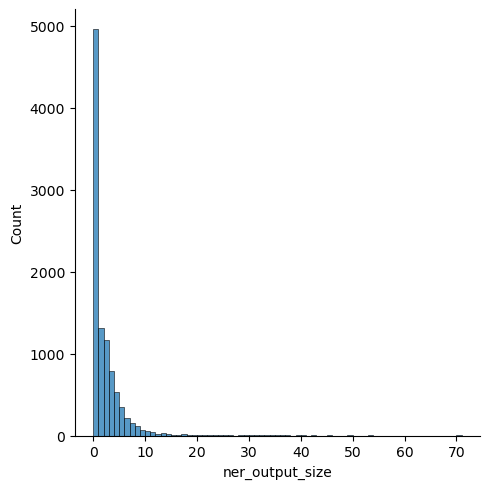

In [305]:
sns.displot(restaurants_reviews['ner_output_size'], binwidth=1)

It is clear to see that in our 9955 reviews, most of them (4955) don’t mention any dishes (or the model fails to capture them), in the rest of the reviews at least 1 dish is referred.

Here is the review with more dishes referred (40 dishes).

In [306]:
restaurants_reviews.iloc[restaurants_reviews['ner_output_size'].argmax()]['preproc_review_ner']

'peaceful n quite place something u want hectic schedule u spend quality time friend family relaxes u wanted relax n take break hectic two day later friend invited place n delighted know place n perfect exactly wanted head place similar guyz awsome place n definitely u fall love lets begin drink first served many mocktails like orange delight amazing blend vit c give u boost hot weather cucumber n mint refreshing beat heat n taste good virgin pina colada good coconut n pineapple flavor n fan coconut flavor especially drink black currant tasted good spicy tango tinge masala like jaljeera n dash spiciness dat pinching sensation different n taken blue lagoon name say blue colored drink dat blue caracao syrup added lemon wedge n mint realllllyyy good food grilled pomfret big fat good looking pomfret marinated awsome blend basic n flavorful spice n grilled mint yogurt dip along onion ring n lemon full flavor bite giving superb taste n fresh taste fish meat good n presented n delicious chill

In [307]:
len(restaurants_reviews[restaurants_reviews['ner_output_size'] > 20])

63

We only have 63 reviews that could be considered outliers, with more than 20 dishes referred.

We will preprocess the result of NER to have only the dishes mentioned (originally the model returns a dictionary).

In [308]:
restaurants_reviews['ner_output_no_numbers'] = restaurants_reviews['ner_output'].apply(lambda list: [re.sub(r'\d+', '', term['word']) for term in list if term['word'].strip().lower() != ''])
restaurants_reviews['dishes'] = restaurants_reviews['ner_output_no_numbers'].apply(lambda list: [words.strip().lower() for words in list if words.strip().lower() != ''])
restaurants_reviews['dishes']

0                                                                                    []
1                                                                                    []
2                                                                [penne, alfredo pasta]
3                                                                                    []
4                                     [kodi, drumstick basket, mutton biryani, pradeep]
                                             ...                                       
9995    [jade chicken soup, spinach based, salad cabbage cucumber kimchi, dressing, ...
9996                                [rice, steamed, fish chilly, garlic noodle chicken]
9997    [hot sour soup, potato plum sauce, brocolli baby corn mushroom spicy sauce, ...
9998                                                                                 []
9999    [chinese, manchow soup, pepper chicken starter, kimchi salad, wolly chicken ...
Name: dishes, Length: 9955, dtyp

In [309]:
unique_dishes = []

for dishes in list(restaurants_reviews["dishes"]):
    for dish in dishes:
        if dish.lstrip().lower() not in unique_dishes:
            unique_dishes.append(dish.lstrip().lower())

print(len(unique_dishes))
print(unique_dishes)

9001
['penne', 'alfredo pasta', 'kodi', 'drumstick basket', 'mutton biryani', 'pradeep', 'crispy corn', 'biryani', 'spicy', 'chili honey lotus', 'soup', 'honey chilli lotus stem', 'kodiak fry', 'mutton biriyani', 'papiya', 'corn cheese ball', 'manchow soup', 'paneer', 'shashlik sizzler', 'sizzler', 'stale paneer', 'cheese balls', 'paneer mushroom kofta', 'papiya shuvro', 'honey chilli lotus stem basket', 'brownie', 'tomato basil shorba different', 'bread', 'kebab', 'daal', 'rotis raita', 'chunk garlic clove', 'bread raita', 'kebabs', 'peanut peanut fan kebab', 'banjara tangdi starter', 'basket biryani kodi drum', 'pulao', 'noodle', 'crumbed mozzarella sticks', 'cheese stick', 'fried pure cheese bliss', 'veg lasagna', 'lasagne', 'chilli corn kernels', 'paneer tikka', 'cottage cheese shashlik', 'nachos', 'red sauce cheese', 'cheese cheese pizza', 'pizza', 'cheese piece', 'mocktails', 'guava chilli apple kiwi', 'shuvro', 'soumen', 'veg', 'fried rice', 'chicken', 'ice cream jamun', 'fish f

There are 9001 unique dishes, but some of them are misspelled, so we will join dishes that have a Levenshtein distance of 1, as this almost certainly means (and we checked) that there was a typo in the review. This method isn't perfect, but we believe that the benefits massively outweight the drawbacks.

In [310]:
dishes_correct = {}

for dish1_index in tqdm(range(len(unique_dishes))):
    for dish2_index in range(dish1_index+1, len(unique_dishes)):
        if nltk_distance.edit_distance(unique_dishes[dish1_index], unique_dishes[dish2_index]) == 1:

            if unique_dishes[dish1_index] not in dishes_correct:
                dishes_correct[unique_dishes[dish1_index]] = []
                
            dishes_correct[unique_dishes[dish1_index]].append(unique_dishes[dish2_index])

100%|██████████| 9001/9001 [5:01:36<00:00,  2.01s/it]   


In [311]:
len(dishes_correct)

727

In [312]:
dishes_correct

{'mutton biryani': ['mutton biriyani', 'mutton biryans', 'muttonbiryani'],
 'crispy corn': ['crispycorn'],
 'biryani': ['biriyani',
  'birayani',
  'biryanis',
  'biryaani',
  'birani',
  'biryani-'],
 'spicy': ['spice', 'spicey'],
 'soup': ['soups', 'sour'],
 'papiya': ['papaya'],
 'manchow soup': ['maonchow soup',
  'manchow sour',
  'mancho soup',
  'man-chow soup',
  'man chow soup'],
 'paneer': ['panner', 'panneer'],
 'sizzler': ['sizzlers'],
 'cheese balls': ['cheese ball', 'chese balls'],
 'brownie': ['brownies'],
 'bread': ['breads'],
 'kebab': ['kebabs', 'kabab', 'kebab-'],
 'daal': ['dal'],
 'kebabs': ['kababs', 'kebab-'],
 'pulao': ['pulav', 'pulaos'],
 'noodle': ['noodles', 'noddle'],
 'lasagne': ['lasagna'],
 'nachos': ['nacho'],
 'pizza': ['pizza-', 'pizzas'],
 'mocktails': ['mocktail',
  'cocktails',
  'mocktails-',
  'moctails',
  'mock-tails'],
 'veg': ['veg-', 'vej'],
 'fried rice': ['fried rice-'],
 'chicken': ['chiken', 'chicken-', 'chichen'],
 'schezwan chicken': [

In [313]:
keys_to_remove= []

for key, values in dishes_correct.items(): 
    for value in values:
        if value in dishes_correct: 
            dishes_correct[key].extend(dishes_correct[value])  
            dishes_correct[key] = list(set(dishes_correct[key]))  
            keys_to_remove.append(value)

for key in set(keys_to_remove):
    del dishes_correct[key]

In [314]:
len(dishes_correct)

609

In [315]:
dishes_correct

{'mutton biryani': ['mutton biriyani', 'mutton biryans', 'muttonbiryani'],
 'crispy corn': ['crispycorn'],
 'biryani': ['biryaani',
  'birani',
  'burani',
  'biriyani',
  'birayani',
  'biriyanis',
  'briyani',
  'biryanis',
  'biryani-'],
 'spicy': ['spices', 'slice', 'spice', 'spicey'],
 'soup': ['sour', 'soups', 'soups-'],
 'papiya': ['papaya'],
 'manchow soup': ['maonchow soup',
  'manchow sour',
  'man chow soup',
  'mancho soup',
  'man-chow soup'],
 'paneer': ['panneer', 'panner'],
 'sizzler': ['sizzlers'],
 'cheese balls': ['cheese ball', 'chese balls'],
 'brownie': ['brownies'],
 'bread': ['breads'],
 'kebab': ['kawab', 'kabbabs', 'kebab-', 'kababs', 'kebabs', 'kabab'],
 'daal': ['jar', 'jam', 'dal', 'jal'],
 'pulao': ['pulavs', 'pulav', 'pulaos'],
 'noodle': ['noodles', 'noddle'],
 'lasagne': ['lasagna', 'lasgna'],
 'nachos': ['nacho'],
 'pizza': ['pizzas', 'pizzaas', 'pizza-'],
 'mocktails': ['mocktail',
  'cocktail',
  'cocktails',
  'moctails',
  'mock tail',
  'mocktails

In [316]:
reversed_dishes_correct = {value: key for key, values in dishes_correct.items() for value in values}
reversed_dishes_correct

{'mutton biriyani': 'mutton biryani',
 'mutton biryans': 'mutton biryani',
 'muttonbiryani': 'mutton biryani',
 'crispycorn': 'crispy corn',
 'biryaani': 'biryani',
 'birani': 'irani',
 'burani': 'irani',
 'biriyani': 'biryani',
 'birayani': 'biryani',
 'biriyanis': 'biryani',
 'briyani': 'biryani',
 'biryanis': 'biryani',
 'biryani-': 'biryani',
 'spices': 'spicy',
 'slice': 'spicy',
 'spice': 'spicy',
 'spicey': 'spicy',
 'sour': 'soup',
 'soups': 'soup',
 'soups-': 'soup',
 'papaya': 'papiya',
 'maonchow soup': 'manchow soup',
 'manchow sour': 'manchow soup',
 'man chow soup': 'manchow soup',
 'mancho soup': 'manchow soup',
 'man-chow soup': 'manchow soup',
 'panneer': 'paneer',
 'panner': 'paneer',
 'sizzlers': 'sizzler',
 'cheese ball': 'cheesy ball',
 'chese balls': 'cheese balls',
 'brownies': 'brownie',
 'breads': 'bread',
 'kawab': 'kebab',
 'kabbabs': 'kebab',
 'kebab-': 'kebab',
 'kababs': 'kebab',
 'kebabs': 'kebab',
 'kabab': 'kebab',
 'jar': 'daal',
 'jam': 'daal',
 'dal'

In [318]:
restaurants_reviews["dishes_correct"] = restaurants_reviews["dishes"].apply(lambda x: replace_words_dict(x, reversed_dishes_correct))
restaurants_reviews["dishes_correct"]

0                                                                                    []
1                                                                                    []
2                                                                [penne, alfredo pasta]
3                                                                                    []
4                                     [kodi, drumstick basket, mutton biryani, pradeep]
                                             ...                                       
9995    [jade chicken soup, spinach based, salad cabbage cucumber kimchi, dressing, ...
9996                                [rice, steamed, fish chilly, garlic noodle chicken]
9997    [hot sour soup, potato plum sauce, brocolli baby corn mushroom spicy sauce, ...
9998                                                                                 []
9999    [chinese, manchow soup, pepper chicken starter, kimchi salad, wolly chicken ...
Name: dishes_correct, Length: 99

In [319]:
unique_dishes2 = []

for dishes in list(restaurants_reviews["dishes_correct"]):
    for dish in dishes:
        if dish.lstrip().lower() not in unique_dishes2:
            unique_dishes2.append(dish.lstrip().lower())

print(len(unique_dishes2))
print(unique_dishes2)

8208
['penne', 'alfredo pasta', 'kodi', 'drumstick basket', 'mutton biryani', 'pradeep', 'crispy corn', 'biryani', 'spicy', 'chili honey lotus', 'soup', 'honey chilli lotus stem', 'kodiak fry', 'papiya', 'corn cheese ball', 'manchow soup', 'paneer', 'shashlik sizzler', 'sizzler', 'stale paneer', 'cheese balls', 'paneer mushroom kofta', 'papiya shuvro', 'honey chilli lotus stem basket', 'brownie', 'tomato basil shorba different', 'bread', 'kebab', 'daal', 'rotis raita', 'chunk garlic clove', 'bread raita', 'peanut peanut fan kebab', 'banjara tangdi starter', 'basket biryani kodi drum', 'pulao', 'noodle', 'crumbed mozzarella sticks', 'cheese stick', 'fried pure cheese bliss', 'veg lasagna', 'lasagne', 'chilli corn kernels', 'paneer tikka', 'cottage cheese shashlik', 'nachos', 'red sauce cheese', 'cheese cheese pizza', 'pizza', 'cheese piece', 'mocktails', 'guava chilli apple kiwi', 'shuvro', 'soumen', 'veg', 'fried rice', 'chicken', 'ice cream jamun', 'fish fry', 'schezwan chicken', 'spr

In [321]:
with open('data/restaurant_reviews_with_ner.pickle', 'wb') as file:  
    pickle.dump(restaurants_reviews, file)

In [325]:
restaurants_reviews.head()

,Restaurant,Cuisines,raw_review,Rating,review_len,sents,nr_sents,preproc_review_ner,ner_output,ner_output_size,ner_output_no_numbers,dishes,dishes_correct
0,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian","The ambience was good, food was quite good . had Saturday lunch , which was ...",5,224,"[The ambience was good, food was quite good ., had Saturday lunch , which wa...",5,ambience good food quite good saturday lunch cost effective good place sate ...,[],0,[],[],[]
1,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Ambience is too good for a pleasant evening. Service is very prompt. Food is...,5,144,"[Ambience is too good for a pleasant evening., Service is very prompt., Food...",5,ambience good pleasant evening service prompt food good good experience soum...,[],0,[],[],[]
2,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",A must try.. great food great ambience. Thnx for the service by Pradeep and ...,5,189,"[A must try.. great food great ambience., Thnx for the service by Pradeep an...",3,must try great food great ambience thnx service pradeep subroto personal rec...,"[{'entity_group': 'FOOD', 'score': 0.83243674, 'word': ' penne', 'start': 88...",2,"[ penne, alfredo pasta]","[penne, alfredo pasta]","[penne, alfredo pasta]"
3,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Soumen das and Arun was a great guy. Only because of their behavior and sinc...,5,148,"[Soumen das and Arun was a great guy., Only because of their behavior and si...",2,soumen da arun great guy behavior sincerety good food course would like visi...,[],0,[],[],[]
4,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are g...,5,160,"[Food is good.we ordered Kodi drumsticks and basket mutton biryani., All are...",6,food ordered kodi drumstick basket mutton biryani good thanks pradeep served...,"[{'entity_group': 'FOOD', 'score': 0.8430239, 'word': ' kodi', 'start': 13, ...",4,"[ kodi, drumstick basket, mutton biryani, pradeep]","[kodi, drumstick basket, mutton biryani, pradeep]","[kodi, drumstick basket, mutton biryani, pradeep]"


## 5. Co-occurence Analysis

[Back to TOC](#toc)

In [2]:
with open('data/restaurant_reviews_with_ner.pickle', 'rb') as file:  
    restaurants_reviews = pickle.load(file)

Now that we have the list of dishes in the reviews, we need to do co-occurrence analysis (the rows are ordered by the frequency of the dishes.).

In [5]:
coocurrence_matrix = pipeline_v2.cooccurrence_matrix_sentence_generator(preproc_sentences=restaurants_reviews["dishes_correct"], sentence_cooc= True)

  0%|          | 0/9955 [00:00<?, ?it/s]

100%|██████████| 9955/9955 [00:00<00:00, 84015.37it/s]


In [6]:
coocurrence_matrix
# some disher are not mention together with any other, that is why some rows have 0

,chicken,biryani,veg,prawn,paneer,pizza,soup,rice,fish,kebab,...,asian salad,chicken tengri kabab,fresh fish masala,briyani combo,rotis sabzi,chapati soft,tandoori lasooni tikka,chicken butter chicken glimpse,chicken shawarma paratha,paneer soft gravy
chicken,0,115,56,36,44,24,49,48,58,35,...,0,0,0,0,0,0,0,0,0,0
biryani,115,0,88,20,25,10,37,44,24,29,...,0,0,0,0,0,0,0,0,0,0
veg,56,88,0,4,19,27,33,14,26,14,...,0,0,0,0,0,0,0,0,0,0
prawn,36,20,4,0,14,5,13,3,20,4,...,0,0,0,0,0,0,0,0,0,0
paneer,44,25,19,14,0,1,22,25,22,12,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mutton thali,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
fish starter fruit pudding,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ice cream chocolate sauce,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
paneer lababdar fish tikka,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


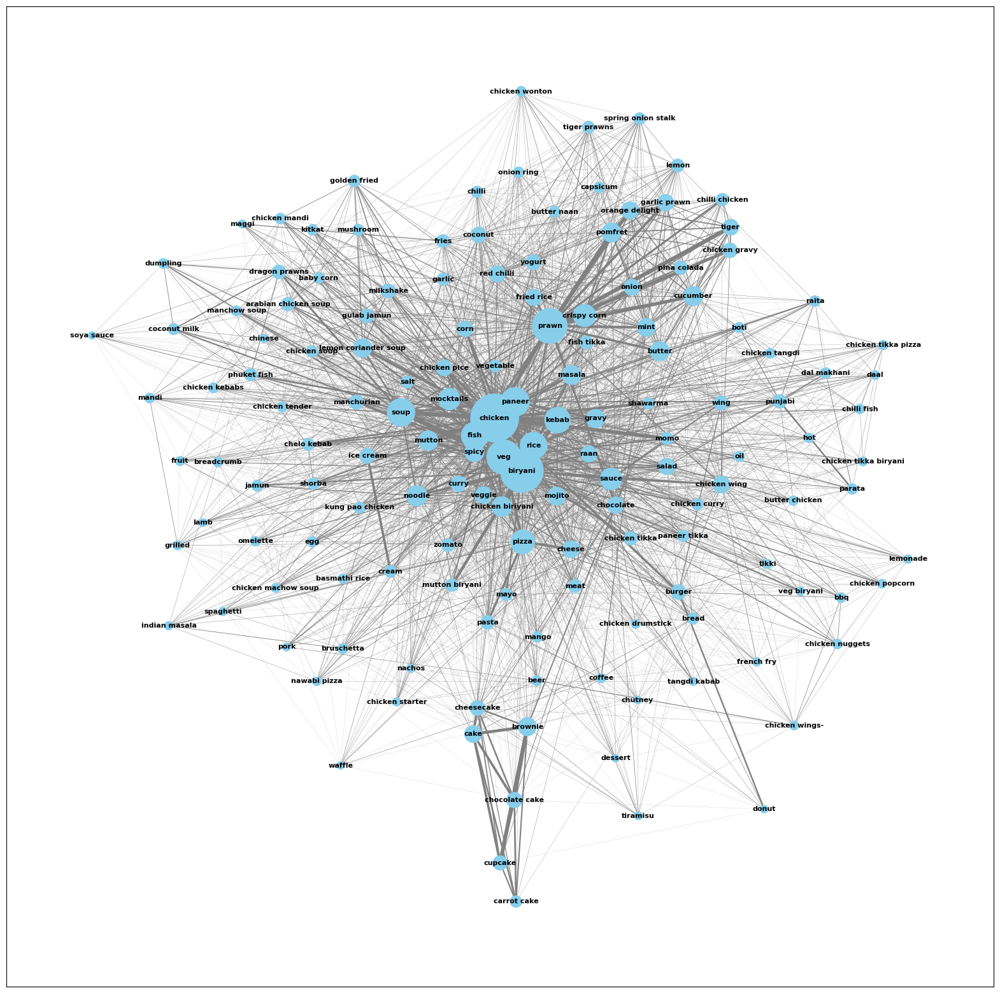

In [8]:
cooccurrence_network_generator(coocurrence_matrix, 150)

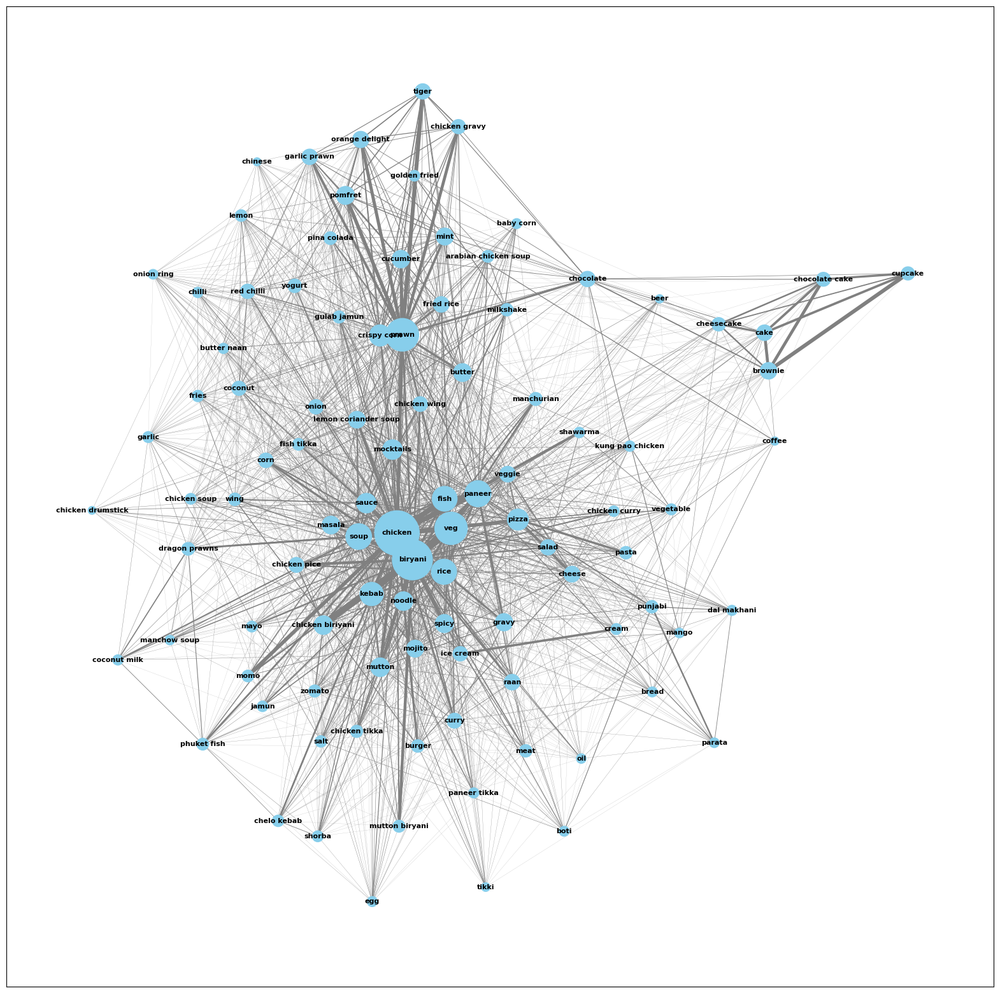

In [9]:
cooccurrence_network_generator(coocurrence_matrix, 100)

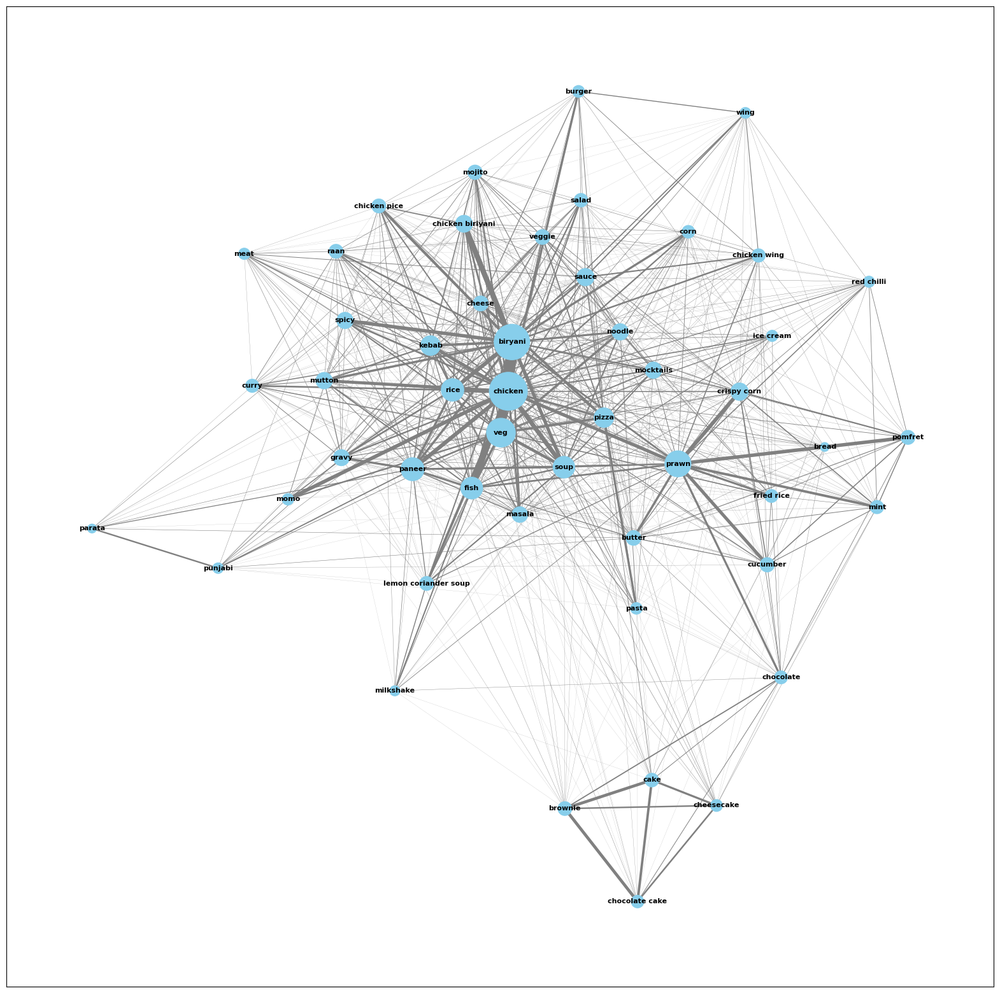

In [10]:
cooccurrence_network_generator(coocurrence_matrix, 50)

After seeing the network of co-occurrence between dishes in the different “scales” (top number of dishes), we can conclude the following. We will make some conclusions based on the cuisine type wordclouds which can be found in the "word_clouds/cuisines" folder of the submission:
- Brownie, cake, cupcake, carrot cake cheesecake and chocolate cake appear very often together, appearing sometimes with chocolate, this makes sense as the cuisines where they're more commonly mentioned (Beverages, Cafe and Dessert) are very similar cuisines.
- Prawn tends to appear with butter, cucumber, tiger, chicken gravy, bread, pomfret, crispy corn, fried rice and mint, there isn't any major cuisine correlation to draw from this information, because these dishes are common across a variety of the asian cuisines present in our data.
- The most common dishes mentioned are biryani, chicken and veg, and they are mentioned almost with any other popular dish, this is likely due to the region of our data and the extreme popularity of byrianis.
- The other common dishes that appear very often with one or more popular dishes already mentioned are: fish, soup, paneer, momo, rice, kebab, mutton, spicy, chicken biriyani, chicken pice, sauce and noodle, this again is too vague to conclude directly about one single cuisine, but these dishes are mostly Asian or Middle-Eastern.
- Ice cream appears very often with cream, which is a clear indicator of reviews about restaurants with Ice Cream cuisine type.
- At the border of the graph connecting to many different dishes with the same frequency we see some drinks like mocktails, mojitos, beer, coffee, lemonade, etc; we also see some basic ingredients like egg, garlic, soy sauce, lemon, etc. This is likely because they are quite general across most cuisine types and dish cultures and thus don't have strong relationships with any of the groups described above.


## 6. Clustering

[Back to TOC](#toc)

Now it's time to see if the dishes form any type of clusters, by the image we can infer some patterns but let's apply some clustering techniques to see if they can capture those relations.

In [11]:
restaurants_reviews.head()

,Restaurant,Cuisines,raw_review,Rating,review_len,sents,nr_sents,preproc_review_ner,ner_output,ner_output_size,ner_output_no_numbers,dishes,dishes_correct
0,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian","The ambience was good, food was quite good . had Saturday lunch , which was ...",5,224,"[The ambience was good, food was quite good ., had Saturday lunch , which wa...",5,ambience good food quite good saturday lunch cost effective good place sate ...,[],0,[],[],[]
1,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Ambience is too good for a pleasant evening. Service is very prompt. Food is...,5,144,"[Ambience is too good for a pleasant evening., Service is very prompt., Food...",5,ambience good pleasant evening service prompt food good good experience soum...,[],0,[],[],[]
2,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",A must try.. great food great ambience. Thnx for the service by Pradeep and ...,5,189,"[A must try.. great food great ambience., Thnx for the service by Pradeep an...",3,must try great food great ambience thnx service pradeep subroto personal rec...,"[{'entity_group': 'FOOD', 'score': 0.83243674, 'word': ' penne', 'start': 88...",2,"[ penne, alfredo pasta]","[penne, alfredo pasta]","[penne, alfredo pasta]"
3,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Soumen das and Arun was a great guy. Only because of their behavior and sinc...,5,148,"[Soumen das and Arun was a great guy., Only because of their behavior and si...",2,soumen da arun great guy behavior sincerety good food course would like visi...,[],0,[],[],[]
4,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are g...,5,160,"[Food is good.we ordered Kodi drumsticks and basket mutton biryani., All are...",6,food ordered kodi drumstick basket mutton biryani good thanks pradeep served...,"[{'entity_group': 'FOOD', 'score': 0.8430239, 'word': ' kodi', 'start': 13, ...",4,"[ kodi, drumstick basket, mutton biryani, pradeep]","[kodi, drumstick basket, mutton biryani, pradeep]","[kodi, drumstick basket, mutton biryani, pradeep]"


### 6.1. Vectorization

We will use only bag of words to count the number of times a dish appears in a review. This is because for this purpose, we are directly attempting to cluster based on word counts and dish co-ocurrence.

In [3]:
restaurants_reviews["dishes_correct_string"] = restaurants_reviews["dishes_correct"].apply(lambda lst: ' '.join([token.replace(' ', '_') for token in lst]))
restaurants_reviews["dishes_correct_string"]

0                                                                                      
1                                                                                      
2                                                                   penne alfredo_pasta
3                                                                                      
4                                          kodi drumstick_basket mutton_biryani pradeep
                                             ...                                       
9995    jade_chicken_soup spinach_based salad_cabbage_cucumber_kimchi dressing cabba...
9996                                     rice steamed fish_chilly garlic_noodle_chicken
9997    hot_sour_soup potato_plum_sauce brocolli_baby_corn_mushroom_spicy_sauce rice...
9998                                                                                   
9999    chinese manchow_soup pepper_chicken_starter kimchi_salad wolly_chicken_egg_f...
Name: dishes_correct_string, Len

In [4]:
# Vectorise using BOW
bow_vectorizer = CountVectorizer(ngram_range=(1,1), token_pattern=r"(?u)\b\w+\b")
ner_dataset_bow_td_matrix = bow_vectorizer.fit_transform(restaurants_reviews["dishes_correct_string"]).toarray()
restaurants_reviews["bow_vector"] = ner_dataset_bow_td_matrix.tolist()

In [5]:
len(restaurants_reviews["bow_vector"][0])

8224

In [6]:
restaurants_reviews.head()

,Restaurant,Cuisines,raw_review,Rating,review_len,sents,nr_sents,preproc_review_ner,ner_output,ner_output_size,ner_output_no_numbers,dishes,dishes_correct,dishes_correct_string,bow_vector
0,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian","The ambience was good, food was quite good . had Saturday lunch , which was ...",5,224,"[The ambience was good, food was quite good ., had Saturday lunch , which wa...",5,ambience good food quite good saturday lunch cost effective good place sate ...,[],0,[],[],[],,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Ambience is too good for a pleasant evening. Service is very prompt. Food is...,5,144,"[Ambience is too good for a pleasant evening., Service is very prompt., Food...",5,ambience good pleasant evening service prompt food good good experience soum...,[],0,[],[],[],,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",A must try.. great food great ambience. Thnx for the service by Pradeep and ...,5,189,"[A must try.. great food great ambience., Thnx for the service by Pradeep an...",3,must try great food great ambience thnx service pradeep subroto personal rec...,"[{'entity_group': 'FOOD', 'score': 0.83243674, 'word': ' penne', 'start': 88...",2,"[ penne, alfredo pasta]","[penne, alfredo pasta]","[penne, alfredo pasta]",penne alfredo_pasta,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Soumen das and Arun was a great guy. Only because of their behavior and sinc...,5,148,"[Soumen das and Arun was a great guy., Only because of their behavior and si...",2,soumen da arun great guy behavior sincerety good food course would like visi...,[],0,[],[],[],,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,Beyond Flavours,"Chinese, Continental, Kebab, European, South Indian, North Indian",Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are g...,5,160,"[Food is good.we ordered Kodi drumsticks and basket mutton biryani., All are...",6,food ordered kodi drumstick basket mutton biryani good thanks pradeep served...,"[{'entity_group': 'FOOD', 'score': 0.8430239, 'word': ' kodi', 'start': 13, ...",4,"[ kodi, drumstick basket, mutton biryani, pradeep]","[kodi, drumstick basket, mutton biryani, pradeep]","[kodi, drumstick basket, mutton biryani, pradeep]",kodi drumstick_basket mutton_biryani pradeep,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


### 6.2. K-Means

In [372]:
elbow_finder(ner_dataset_bow_td_matrix,20, verbose=False)

100%|██████████| 20/20 [01:20<00:00,  4.04s/it]

Optimal value of k according to the elbow method: 4


4

In [16]:
kmeans_bow = KMeans(n_clusters=4, random_state=42).fit(ner_dataset_bow_td_matrix)
restaurants_reviews["kmeans_bow_clusters"] = kmeans_bow.labels_.tolist()

In [9]:
restaurants_reviews["kmeans_bow_clusters"].value_counts()

1    9467
0     351
2     136
3       1
Name: kmeans_bow_clusters, dtype: int64

In [19]:
restaurants_reviews = cluster_namer(restaurants_reviews, "kmeans_bow_clusters")
restaurants_reviews["kmeans_bow_clusters"].value_counts()

_veg_biryani_pizza_cake_rice                               9467
_chicken_biryani_veg_shawarma_prawn                         351
_biryani_veg_chicken_chicken_biriyani_rice                  136
_chicken_chicken_tikka_pizza_cucumber_chilli_fish_kebab       1
Name: kmeans_bow_clusters, dtype: int64

In [21]:
plotter_3d_cluster(restaurants_reviews,"bow_vector","kmeans_bow_clusters")

This is a very bad cluster solution, not grouping by dish since the most common dishes appear in all clusters, and the distribution of observations is very unbalanced, so it is not working like this.

In [381]:
variance = []
for n in range(100, 1000, 100):
    lsa = TruncatedSVD(n_components=n)
    lsa_result = lsa.fit_transform(ner_dataset_bow_td_matrix)
    variance.append(lsa.explained_variance_ratio_.sum())

In [390]:
variance

[0.47130783023251677,
 0.5686385897461861,
 0.6289149053661348,
 0.6727295533510101,
 0.7072014010026773,
 0.7355089619232543,
 0.7598133369350473,
 0.7810108907657782,
 0.7997547596177603]

In [22]:
lsa = TruncatedSVD(n_components=600)
lsa_result = lsa.fit_transform(ner_dataset_bow_td_matrix)

elbow_finder(ner_dataset_bow_td_matrix,20, verbose=False)

100%|██████████| 20/20 [01:13<00:00,  3.67s/it]

Optimal value of k according to the elbow method: 4


4

In [23]:
kmeans_bow_lsa = KMeans(n_clusters=4, random_state=42).fit(lsa_result)
restaurants_reviews["kmeans_bow_clusters_lsa_600"] = kmeans_bow_lsa.labels_.tolist()
restaurants_reviews["kmeans_bow_clusters_lsa_600"].value_counts()

2    9520
0     433
3       1
1       1
Name: kmeans_bow_clusters_lsa_600, dtype: int64

In [24]:
restaurants_reviews = cluster_namer(restaurants_reviews, "kmeans_bow_clusters_lsa_600")
restaurants_reviews["kmeans_bow_clusters_lsa_600"].value_counts()

_chicken_veg_pizza_cake_rice                               9520
_biryani_chicken_veg_chicken_biriyani_spicy                 433
_chicken_chicken_tikka_pizza_cucumber_chilli_fish_kebab       1
_chicken_mutton_meat_mojito_ve                                1
Name: kmeans_bow_clusters_lsa_600, dtype: int64

In [25]:
plotter_3d_cluster(restaurants_reviews,"bow_vector","kmeans_bow_clusters_lsa_600")

After applying LSA to reduce the dimensionality of our data the results didn’t improve, we will try with other clustering methods.

### 6.3. Hierarchical

In [398]:
clustering_hierarchical_ward = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage= 'ward').fit(ner_dataset_bow_td_matrix)

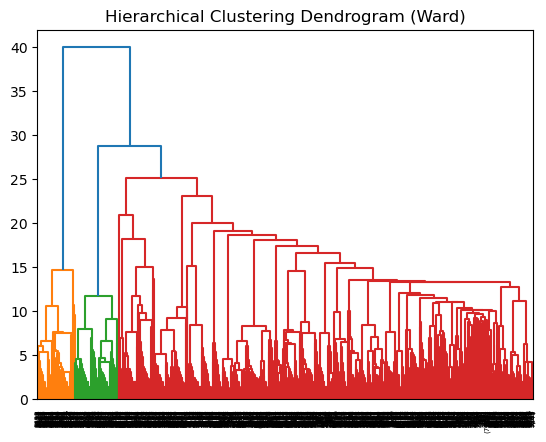

In [400]:
fig, ax = plt.subplots()
plt.title("Hierarchical Clustering Dendrogram (Ward)")
plot_dendrogram(clustering_hierarchical_ward, truncate_mode="level")
plt.show()

In [33]:
restaurants_reviews['hierarquical_bow_clusters'] = AgglomerativeClustering(n_clusters=4, linkage= 'ward').fit_predict(ner_dataset_bow_td_matrix)
restaurants_reviews["hierarquical_bow_clusters"].value_counts()

0    9493
1     175
2     166
3     121
Name: hierarquical_bow_clusters, dtype: int64

In [34]:
restaurants_reviews = cluster_namer(restaurants_reviews, "hierarquical_bow_clusters")
restaurants_reviews["hierarquical_bow_clusters"].value_counts()

_biryani_pizza_chicken_cake_rice               9493
_chicken_momo_prawn_fish_soup                   175
_veg_biryani_chicken_fish_soup                  166
_biryani_rice_chicken_chicken_biriyani_raan     121
Name: hierarquical_bow_clusters, dtype: int64

In [35]:
plotter_3d_cluster(restaurants_reviews,"bow_vector","hierarquical_bow_clusters")

Using hierarchical clustering leads to the same bad results as K-means, we will try to use some density based clustering methods to see if the results improve.

### 6.4. HDBScan

In [26]:
hdbscan = HDBSCAN(min_cluster_size=5).fit(ner_dataset_bow_td_matrix)
restaurants_reviews["hdbscan_bow_clusters"] = hdbscan.labels_.tolist()
restaurants_reviews['hdbscan_bow_clusters'].value_counts()

 46    5045
-1     4069
 28      93
 14      73
 22      53
 19      45
 33      40
 10      36
 26      30
 0       28
 42      23
 35      20
 11      19
 23      19
 40      18
 41      17
 9       16
 24      16
 25      16
 7       15
 39      14
 44      14
 36      14
 13      14
 16      13
 31      13
 1       12
 21      11
 34      11
 5       11
 8       10
 12      10
 38      10
 37      10
 2        9
 27       8
 18       8
 15       8
 17       7
 29       7
 43       6
 47       6
 4        6
 30       6
 45       6
 3        5
 6        5
 32       5
 20       5
Name: hdbscan_bow_clusters, dtype: int64

In [27]:
restaurants_reviews = cluster_namer(restaurants_reviews, "hdbscan_bow_clusters")
restaurants_reviews["hdbscan_bow_clusters"].value_counts()

_sushi_cold_chicken_wing_serve_chicken_special_cheese_shawarma                                                                                                         5045
_biryani_chicken_veg_pizza_rice                                                                                                                                        4069
_biryani_chicken_biriyani_fried_rice_mutton_biryani_ulavacharu                                                                                                           93
_chicken_stale_chic_bad_rumali_chicken_steak_burger_chicken_laila_biryani_spicy_chicken                                                                                  73
_veg_veg_starter_egg_item_white_pasta_dessert                                                                                                                            53
_chicken_biriyani_chicken_mutton_biryani_chicken_tandoori_chicken_chicken_fresh                                                             

In [35]:
plotter_3d_cluster(restaurants_reviews,"bow_vector","hdbscan_bow_clusters")

### 6.5. Optics

In [29]:
optics = OPTICS(metric='cosine',min_samples=2).fit(ner_dataset_bow_td_matrix)
restaurants_reviews['optics_bow_clusters'] = optics.labels_.tolist()
restaurants_reviews['optics_bow_clusters'].value_counts()

c:\Users\luisb\anaconda3\envs\text-mining1\lib\site-packages\sklearn\cluster\_optics.py:1083: RuntimeWarning:

divide by zero encountered in divide



-1      8336
 15       90
 27       61
 1        53
 8        38
        ... 
 127       2
 0         2
 283       2
 194       2
 330       2
Name: optics_bow_clusters, Length: 389, dtype: int64

In [30]:
restaurants_reviews = cluster_namer(restaurants_reviews, "optics_bow_clusters")
restaurants_reviews["optics_bow_clusters"].value_counts()

_biryani_chicken_veg_pizza_rice                                                                                   8336
_biryani_mutton_biryani_mutton__cashew_paste_pan_seared_fish_tomato_fish                                            90
_chicken_chilli_kebab_chicken_butter_chicken_schezewan_chicken_fried_rice                                           61
_veg_lotus_angur_gulab_jamun_cream_pan_seared                                                                       53
_pizza__cashew_paste_pan_fried_fish_steak_pancake_breakfast_panasa_kaya_curry                                       38
                                                                                                                  ... 
_biryani_veg_paneer_chicken_pice__cashew_paste_pan_seared_fish_tomato_fish                                           2
_alfredo_pasta_penne__cashew_paste_pan_fried_momos_pancake_breakfast                                                 2
_fried_maggie_cabbage_veg_corn_maggie__cashew_pa

In [36]:
plotter_3d_cluster(restaurants_reviews,"bow_vector","optics_bow_clusters")

Density based methods clustering also yield bad results, putting the majority of observations as outliers with no predefined cluster, creating 49 clusters using HDBScan and 388 clusters using optics.

### 6.6. Results Cluster Models

In [42]:
model_list = [("kmeans", kmeans_bow, ner_dataset_bow_td_matrix),
              ("kmeans lda", kmeans_bow_lsa, ner_dataset_bow_td_matrix),
              ("hdbscan", hdbscan, ner_dataset_bow_td_matrix),
              ("optics", optics, ner_dataset_bow_td_matrix)]

In [45]:
unsupervised_score_calculator(model_list)

Inertia of kmeans: 22295.525247329115
Silhouette score of kmeans: 0.4781467289230513
Calinski-Harabasz score of kmeans: 220.4539370175184


Inertia of kmeans lda: 16404.38300589815
Silhouette score of kmeans lda: 0.4541089069857622
Calinski-Harabasz score of kmeans lda: 158.69334519803436


Silhouette score of hdbscan: 0.36500714315442545
Calinski-Harabasz score of hdbscan: 12.42967291166362


Silhouette score of optics: 0.07904757920282252
Calinski-Harabasz score of optics: 5.132593317139477




By interpreting only the silhouette score we can see that all of our clusters are very bad, not even reaching 0.5, with the initial K-means cluster as the "best" solution.

### 6.7. Results Graph and Cuisines Wordclouds

Since all of our model cluster solutions are bad, we will try to perform clusters by looking at the co-occurrence network graph of the dishes and seeing the cuisine type that those combinations of dishes might belong to.


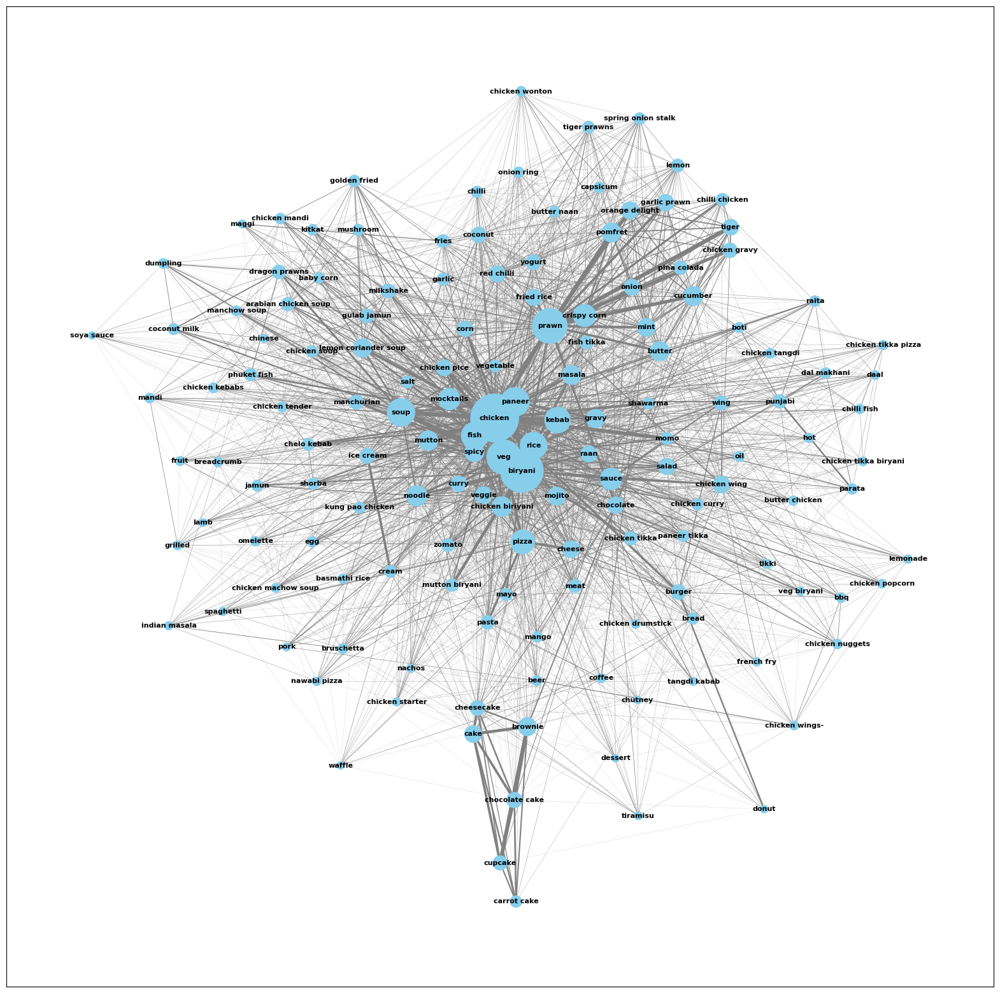

In [ ]:
cooccurrence_network_generator(coocurrence_matrix, 150)

So, after seeing the wordclouds of the most frequent words that appear in each of the cuisines and seeing the co-occurrence graph of the dishes we can conclude the following:
+ The group of dishes formed by cheesecake, cake, carrot, cake, cupcake, chocolate cake and brownie can be associated to a group of similar cuisines: Bakery, Beverages, Cafe and Dessert.
+ The pair ice cream and cream clearly belongs to the Ice Cream cuisine.
+ The group of donuts, burger, chicken wings, wings, bbq, French fries clearly relate to American, BBQ and Burger cuisines (which are all American based cuisines).
+ There is a cluster that follows only the combination of burger, coffee and donuts that relates to the Beverage and the Cafe cuisines.
+ The group of FastFood dishes, which involves the following dishes: chicken, donuts, burger, French fries, pizza, cake, cheese and wing is related to the Fast Food cuisine as well as the Pizza and Burger cuisines, which are also fast food.
+ The Italian cuisine from a distinct cluster containing pizza, pasta and cheese.
+ The combination of fish, prawn and pomfret clearly indicates reviews about the Seafood and Goan cuisines.
+ The biggest group is the one formed by the combination of chicken, biryani, rice, spicy, curry, fish, paneer, mutton, veg, kebab, momos and soup, this group relates to: Andhra, Arabian, Asian, Biryani, Chinese, Indonesian, Modern India, Mughlai, Kebab, Momos, Northeastern, North Indian, SouthIndian, Hyderabadi and Thai cuisines. We could only consider the relations that correspond to each of the cuisines, but we are keeping all of those as a group since they share similar foods between them and thus their dishes end up clustered together. 
+ The rest of the cuisines are not easily identifiable using the co-occurrence of the dishes in the reviews, but we can clearly state that the cuisines respect their themes and the reviews mention them (with a positive or negative connotation).


## 7. References

[Back to TOC](#toc)

[1] "RoBERTa-Base Food NER," Hugging Face, 2024. [Online]. Available: https://huggingface.co/carolanderson/roberta-base-food-ner.